# Domain Background

Dengue fever is a mosquito-borne disease that occurs in tropical and sub-tropical parts of the world. In mild cases, symptoms are similar to the flu: fever, rash, and muscle and joint pain. In severe cases, dengue fever can cause severe bleeding, low blood pressure, and even death. Because it is carried by mosquitoes, the transmission dynamics of dengue are [related to climate variables](http://ehp.niehs.nih.gov/wp-content/uploads/121/11-12/ehp.1306556.pdf) such as temperature and precipitation. Although the relationship to climate is complex, a growing number of scientists argue that climate change is likely to produce distributional shifts that will have significant [public health implications worldwide](http://rstb.royalsocietypublishing.org/content/370/1665/20140135.full).

An understanding of the relationship between climate and dengue dynamics can improve research initiatives and resource allocation to help fight life-threatening pandemics.


# Problem Statement

Given the data of two cities, San Juan and Iquitos, each city spanning 5 and 3 years respectively, the objective is to learn from the data and predict the number of dengue cases each week, in each location, based on environmental variables describing changes in temperature, precipitation, vegetation, and more


# Datasets and Inputs

The Training data (features + labels) is provided by the drivendata [competition](https://www.drivendata.org/competitions/44/dengai-predicting-disease-spread/) and each entry in the features file has the following data:

City and date indicators:
* <code>city</code> – City abbreviations: sj for San Juan and iq for Iquitos
* <code>week_start_date</code> – Date given in yyyy-mm-dd format

NOAA's GHCN daily climate data weather station measurements:
* <code>station_max_temp_c</code> – Maximum temperature
* <code>station_min_temp_c</code> – Minimum temperature
* <code>station_avg_temp_c</code> – Average temperature
* <code>station_precip_mm</code> – Total precipitation
* <code>station_diur_temp_rng_c</code> – Diurnal temperature range

PERSIANN satellite precipitation measurements (0.25x0.25 degree scale)
* <code>precipitation_amt_mm</code> – Total precipitation

NOAA's NCEP Climate Forecast System Reanalysis measurements (0.5x0.5 degree scale)
* <code>reanalysis_sat_precip_amt_mm</code> – Total precipitation
* <code>reanalysis_dew_point_temp_k</code> – Mean dew point temperature
* <code>reanalysis_air_temp_k</code> – Mean air temperature
* <code>reanalysis_relative_humidity_percent</code> – Mean relative humidity
* <code>reanalysis_specific_humidity_g_per_kg</code> – Mean specific humidity
* <code>reanalysis_precip_amt_kg_per_m2</code> – Total precipitation
* <code>reanalysis_max_air_temp_k</code> – Maximum air temperature
* <code>reanalysis_min_air_temp_k</code> – Minimum air temperature
* <code>reanalysis_avg_temp_k</code> – Average air temperature
* <code>reanalysis_tdtr_k</code> – Diurnal temperature range

Satellite vegetation - Normalized difference vegetation index (NDVI) - NOAA's CDR Normalized Difference Vegetation Index (0.5x0.5 degree scale) measurements:
* <code>ndvi_se</code> – Pixel southeast of city centroid
* <code>ndvi_sw</code> – Pixel southwest of city centroid
* <code>ndvi_ne</code> – Pixel northeast of city centroid
* <code>ndvi_nw</code> – Pixel northwest of city centroid


# Benchmark Model
The competition already provided a [benchmark model](http://drivendata.co/blog/dengue-benchmark/). The benchmark model hypothesizes that the spread of dengue may follow different patterns between the two cities, therefore the dataset was divided and trained two separate models for each city.

As for the regression model it was chosen the Negative Binomial Distribution, one reason to choose this was because the variance of the labels values is greater than the mean of the labels, and as for the data it was pre-processed in order to fill the NaN values with the previous values and selected the four features that shown more correlation with the labels.

Finally as for training as a timeseries model , it was used a strict-future holdout set when splitting the training set and the test set, by keeping around three quarters of the original data for training and the rest to test. After trained, the model was use to predict the total cases for a test set provided by the competition and the results submitted. The submission score was 25.8173.

# Load Data

In [1]:
#Import the necessary libraries
%matplotlib inline

import pandas as pd
import numpy as np

from pandas.plotting import scatter_matrix
from matplotlib import pyplot as plt

from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA

import seaborn as sns

#Load competition data
dengue_features_train = pd.read_csv("dengue_features_train.csv")
dengue_labels_train = pd.read_csv("dengue_labels_train.csv")
dengue_features_test = pd.read_csv("dengue_features_test.csv")

# Display first records
display(dengue_features_train.head(n=3))

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
0,sj,1990,18,1990-04-30,0.12260,0.103725,0.198483,0.177617,12.42,297.572857,...,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0
1,sj,1990,19,1990-05-07,0.16990,0.142175,0.162357,0.155486,22.82,298.211429,...,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6
2,sj,1990,20,1990-05-14,0.03225,0.172967,0.157200,0.170843,34.54,298.781429,...,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4


In [2]:
dengue_features_train.dtypes

city                                      object
year                                       int64
weekofyear                                 int64
week_start_date                           object
ndvi_ne                                  float64
ndvi_nw                                  float64
ndvi_se                                  float64
ndvi_sw                                  float64
precipitation_amt_mm                     float64
reanalysis_air_temp_k                    float64
reanalysis_avg_temp_k                    float64
reanalysis_dew_point_temp_k              float64
reanalysis_max_air_temp_k                float64
reanalysis_min_air_temp_k                float64
reanalysis_precip_amt_kg_per_m2          float64
reanalysis_relative_humidity_percent     float64
reanalysis_sat_precip_amt_mm             float64
reanalysis_specific_humidity_g_per_kg    float64
reanalysis_tdtr_k                        float64
station_avg_temp_c                       float64
station_diur_temp_rn

*** Comments:*** Not considering the city and dates related features, the rest have the same type, float64. There are no categorical variables, therefore there's no need to use One-Hot Encoding.

In [3]:
# Split the datasets into two dataframes, one per city

# San Juan, Puerto Rico
dengue_features_train_sj = dengue_features_train[dengue_features_train['city'] == 'sj']
dengue_features_train_sj = dengue_features_train_sj.reset_index(drop = True)
dengue_features_train_sj = dengue_features_train_sj.drop(['city'], axis=1)

dengue_labels_train_sj = dengue_labels_train[dengue_labels_train['city'] == 'sj']
dengue_labels_train_sj = dengue_labels_train_sj.reset_index(drop = True)
dengue_labels_train_sj = dengue_labels_train_sj.drop(['city'], axis=1)

dengue_features_test_sj = dengue_features_test[dengue_features_test['city'] == 'sj']
dengue_features_test_sj = dengue_features_test_sj.reset_index(drop = True)
dengue_features_test_sj = dengue_features_test_sj.drop(['city'], axis=1)

# Iquitos, Peru
dengue_features_train_iq = dengue_features_train[dengue_features_train['city'] == 'iq']
dengue_features_train_iq = dengue_features_train_iq.reset_index(drop = True)
dengue_features_train_iq = dengue_features_train_iq.drop(['city'], axis=1)

dengue_labels_train_iq = dengue_labels_train[dengue_labels_train['city'] == 'iq']
dengue_labels_train_iq = dengue_labels_train_iq.reset_index(drop = True)
dengue_labels_train_iq = dengue_labels_train_iq.drop(['city'], axis=1)

dengue_features_test_iq = dengue_features_test[dengue_features_test['city'] == 'iq']
dengue_features_test_iq = dengue_features_test_iq.reset_index(drop = True)
dengue_features_test_iq = dengue_features_test_iq.drop(['city'], axis=1)

In [4]:
#drop columns that will be used for the time series model
columns_to_preprocess = dengue_features_train_sj.keys().difference(['year', 'weekofyear', 'week_start_date'])

#A look at the data
dengue_features_train_sj[columns_to_preprocess].describe().T

,count,mean,std,min,25%,50%,75%,max
ndvi_ne,745.0,0.057925,0.107153,-0.406250,0.004500,0.057700,0.111100,0.493400
ndvi_nw,887.0,0.067469,0.092479,-0.456100,0.016425,0.068075,0.115200,0.437100
ndvi_se,917.0,0.177655,0.057166,-0.015533,0.139283,0.177186,0.212557,0.393129
ndvi_sw,917.0,0.165956,0.056073,-0.063457,0.129157,0.165971,0.202771,0.381420
precipitation_amt_mm,927.0,35.470809,44.606137,0.000000,0.000000,20.800000,52.180000,390.600000
reanalysis_air_temp_k,930.0,299.163653,1.236429,295.938571,298.195000,299.254286,300.132857,302.200000
reanalysis_avg_temp_k,930.0,299.276920,1.218637,296.114286,298.300000,299.378571,300.228571,302.164286
reanalysis_dew_point_temp_k,930.0,295.109519,1.569943,289.642857,293.847857,295.464286,296.418929,297.795714
reanalysis_max_air_temp_k,930.0,301.398817,1.258927,297.800000,300.400000,301.500000,302.400000,304.300000
reanalysis_min_air_temp_k,930.0,297.301828,1.294705,292.600000,296.300000,297.500000,298.400000,299.900000


***Comments:*** By analysing the table above, we can that the features values have different magnitudes, this will be addressed by scaling the features. 

Text(0,0.5,'Number of Cases')

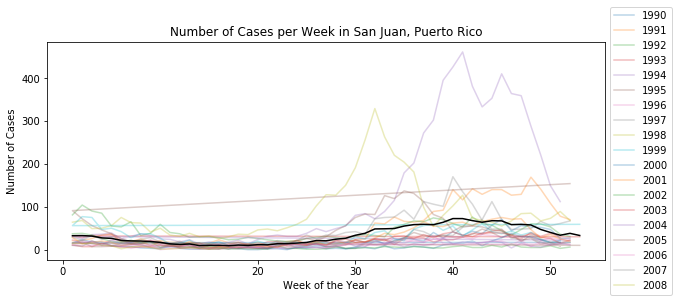

In [5]:
# plot cases for each week each year in San Juan
for i in set(dengue_labels_train_sj['year']):
    df = dengue_labels_train_sj[dengue_labels_train_sj['year'] == i]
    df.set_index('weekofyear', drop = True, inplace = True)
    plt.plot(df['total_cases'], alpha = .3)

dengue_labels_train_sj.groupby('weekofyear')['total_cases'].mean().plot(c = 'k', figsize = (10,4))
plt.legend(set(dengue_labels_train_sj['year']), loc='center left', bbox_to_anchor=(1, .5))

plt.title('Number of Cases per Week in San Juan, Puerto Rico')
plt.xlabel('Week of the Year')
plt.ylabel('Number of Cases')

*** Comments: *** There is a pattern, the second half of the years is characterized by a higher number of dengue cases.
This information is important to understand the behaviour througout time, confirming that the time is a factor to be considered.

### Check for skewness - Logarithmic transfomation

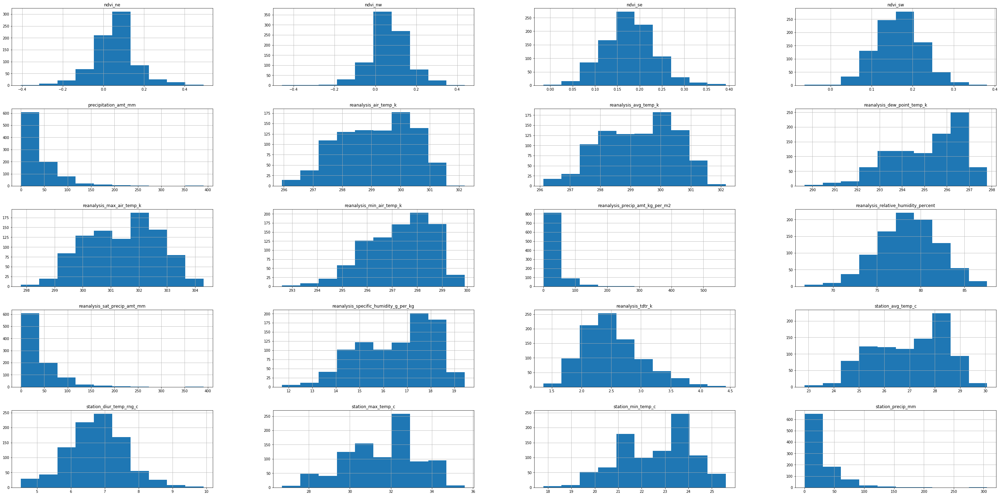

In [6]:
# Check for distribution
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = [50, 25]
dengue_features_train_sj[columns_to_preprocess].hist()
plt.show()

*** Comments: *** Some of the graphs are highly right skewed, namely the ones corresponding to the features:
- precipitation_amt_mm
- reanalysis_precip_amt_kg_per_m2
- reanalysis_sat_precip_amt_mm
- station_precip_mm

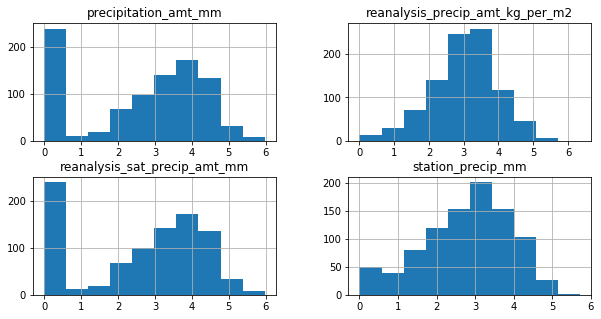

In [7]:
# Let's apply the logarithmic transformation on the following features:
right_skewed_columns = ['precipitation_amt_mm', 'reanalysis_precip_amt_kg_per_m2','reanalysis_sat_precip_amt_mm','station_precip_mm']

# Log-transform the skewed features
dengue_log_features_train_sj = pd.DataFrame(data = dengue_features_train_sj)
dengue_log_features_train_sj[right_skewed_columns] = dengue_log_features_train_sj[right_skewed_columns].apply(lambda x: np.log(x + 1))

dengue_log_features_test_sj = pd.DataFrame(data = dengue_features_test_sj)
dengue_log_features_test_sj[right_skewed_columns] = dengue_log_features_test_sj[right_skewed_columns].apply(lambda x: np.log(x + 1))


# Visualize the new log distributions
plt.rcParams['figure.figsize'] = [10, 5]
dengue_log_features_train_sj[right_skewed_columns].hist()
plt.show()

### Feature scaling (SJ)

In [8]:
# Let's check the missing values in the dataset
pd.isnull(dengue_log_features_train_sj).any()

year                                     False
weekofyear                               False
week_start_date                          False
ndvi_ne                                   True
ndvi_nw                                   True
ndvi_se                                   True
ndvi_sw                                   True
precipitation_amt_mm                      True
reanalysis_air_temp_k                     True
reanalysis_avg_temp_k                     True
reanalysis_dew_point_temp_k               True
reanalysis_max_air_temp_k                 True
reanalysis_min_air_temp_k                 True
reanalysis_precip_amt_kg_per_m2           True
reanalysis_relative_humidity_percent      True
reanalysis_sat_precip_amt_mm              True
reanalysis_specific_humidity_g_per_kg     True
reanalysis_tdtr_k                         True
station_avg_temp_c                        True
station_diur_temp_rng_c                   True
station_max_temp_c                        True
station_min_t

In [9]:
# fill the missing values (NaN) with the previous value
dengue_log_features_train_sj.fillna(method='ffill', inplace=True)
dengue_log_features_test_sj.fillna(method='ffill', inplace=True)

# Normalization should be done on both, train and test features datasets, ensuring that the values in both datasets remain
# as of same magnitude. Therefore these datasets will be joined, be applied the minmax normalization and then splitted.
dengue_log_features_train_sj['data_set'] = 'train'
dengue_log_features_test_sj['data_set']  = 'test'

dengue_norm_log_features_sj  = dengue_log_features_train_sj.append(dengue_log_features_test_sj)

# Initialize a scaler, then apply it to the features
scaler = MinMaxScaler() # default=(0, 1)
dengue_norm_log_features_sj[columns_to_preprocess] = scaler.fit_transform(dengue_norm_log_features_sj[columns_to_preprocess])

# separate into the original datasets, dropping the temporary columns 'dataset'
dengue_norm_log_features_train_sj = dengue_norm_log_features_sj[dengue_norm_log_features_sj['data_set'] == 'train']
dengue_norm_log_features_train_sj = dengue_norm_log_features_train_sj.reset_index(drop = True)
dengue_norm_log_features_train_sj = dengue_norm_log_features_train_sj.drop(['data_set'], axis=1)

dengue_norm_log_features_test_sj = dengue_norm_log_features_sj[dengue_norm_log_features_sj['data_set'] == 'test']
dengue_norm_log_features_test_sj = dengue_norm_log_features_test_sj.reset_index(drop = True)
dengue_norm_log_features_test_sj = dengue_norm_log_features_test_sj.drop(['data_set'], axis=1)

# Show an example of a record with scaling applied
display(dengue_norm_log_features_train_sj.head(n = 1))

,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
0,1990,18,1990-04-30,0.60801,0.506583,0.523701,0.541889,0.434948,0.261008,0.269185,...,0.550782,0.372785,0.434948,0.297392,0.413953,0.35,0.486618,0.303371,0.247191,0.494753


### Remove outliers from SJ dataset

In [10]:
# Get list of outliers using turkey method
outliersList = []
outliers = []

# For each feature find the data points with extreme high or low values
for feature in columns_to_preprocess:
    
    # TODO: Calculate Q1 (25th percentile of the data) for the given feature
    Q1 = np.percentile(dengue_norm_log_features_train_sj[feature], 25)
    
    # TODO: Calculate Q3 (75th percentile of the data) for the given feature
    Q3 = np.percentile(dengue_norm_log_features_train_sj[feature], 75)
       
    # TODO: Use the interquartile range to calculate an outlier step (1.5 times the interquartile range)
    #step = (Q3 - Q1)*1.5
    step = (Q3 - Q1)*2
    
    # Display the outliers
   # print("Data points considered outliers for the feature '{}':".format(feature))
    #display(features_log_minmax_transform_sj[~((features_log_minmax_transform_sj[feature] >= Q1 - step) & (features_log_minmax_transform_sj[feature] <= Q3 + step))])
    
    outliersList.append(dengue_norm_log_features_train_sj[~((dengue_norm_log_features_train_sj[feature] >= Q1 - step) & (dengue_norm_log_features_train_sj[feature] <= Q3 + step))].index)


for i in range(len(outliersList)):
    for aux in outliersList[i + 1:]:
        outliers = np.union1d(outliers, np.intersect1d(outliersList[i], aux))

outliers = outliers.astype(int)
print("Outliers: ", outliers, " Total =",len(outliers))
        
# Remove the outliers, if any were specified
dengue_norm_log_outliers_features_train_sj = dengue_norm_log_features_train_sj.drop(dengue_norm_log_features_train_sj.index[outliers]).reset_index(drop = True)
dengue_outliers_labels_train_sj = dengue_labels_train_sj.drop(dengue_labels_train_sj.index[outliers]).reset_index(drop = True)

Outliers:  [ 13  38 507 513 544 563 565 591]  Total = 8


### Work on Correlation (SJ)

Through the use of Scatter Matrices and correlation heatmaps we can check the correlation between features and check the correlation between features and labels. The objective is to discard irrelevant (or even not less relevant) features.


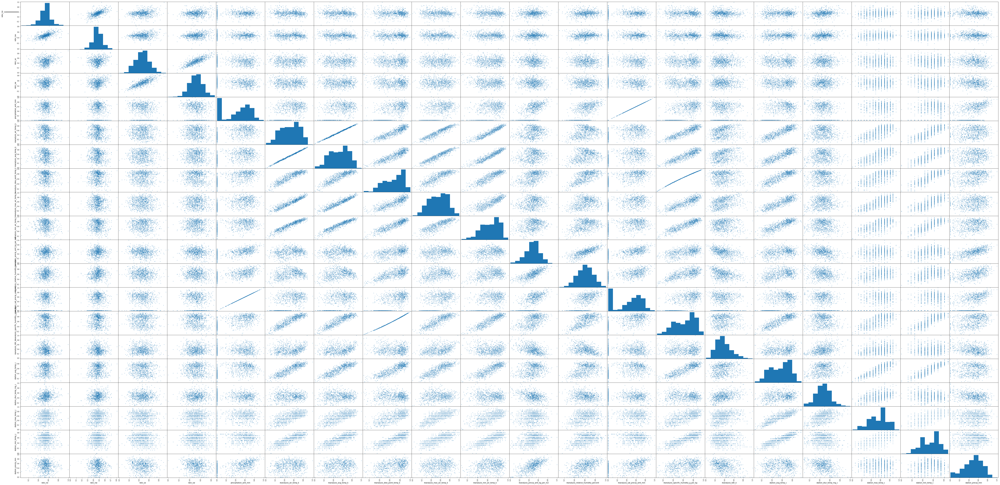

In [11]:
# Scatterplot Matrix - Feature Distributions
plt.rcParams['figure.figsize'] = [100, 50]
scatter_matrix(dengue_norm_log_outliers_features_train_sj[columns_to_preprocess])
plt.show()

Text(0.5,1,'San Juan Variable Correlations')

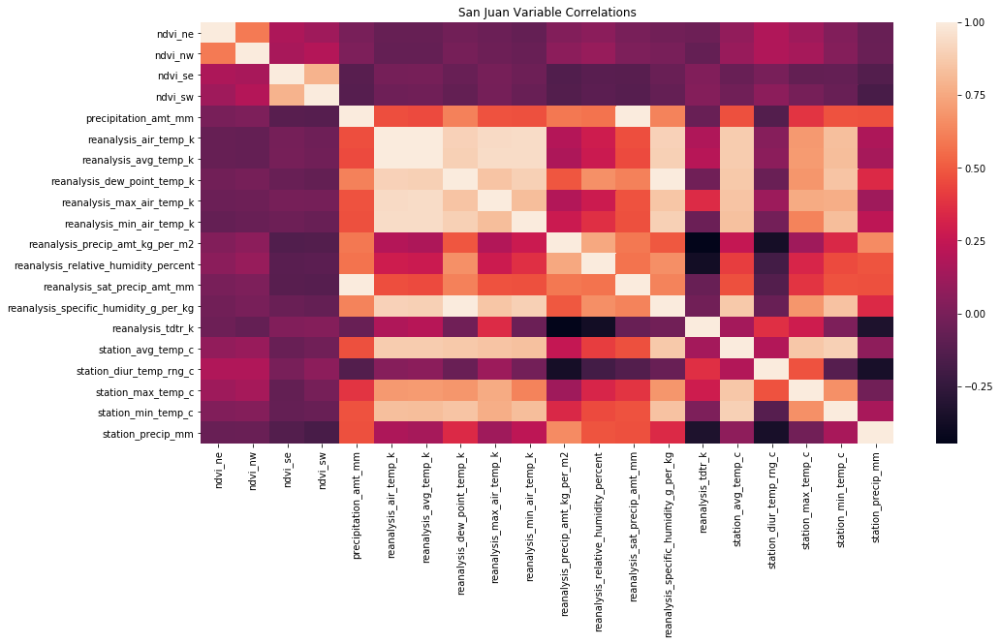

In [12]:
# plot san juan correlation matrix
plt.rcParams['figure.figsize'] = [16, 8]
sj_correlations = dengue_norm_log_outliers_features_train_sj[columns_to_preprocess].corr()
sj_corr_heat = sns.heatmap(sj_correlations)
plt.title('San Juan Variable Correlations')

*** Comments: *** When checking the above plots, it is clear that a few features shows signs of correlation, which was already expected since some of them are actually measures of the same phenomena but from different sources/readers, e.g. precipitation.

This correlation between faetures will allow to work towards the reduction of data dimensionality.

In [13]:
# PCA
pca_sj = PCA(n_components=6)
pca_sj.fit(dengue_norm_log_outliers_features_train_sj[columns_to_preprocess])

pca_train_sj = pca_sj.transform(dengue_norm_log_outliers_features_train_sj[columns_to_preprocess])
pca_test_sj = pca_sj.transform(dengue_norm_log_features_test_sj[columns_to_preprocess])

# Create DataFrames for the reduced datasets
pca_train_sj = pd.DataFrame(pca_train_sj, columns=['D1', 'D2','D3', 'D4','D5', 'D6'])
pca_test_sj = pd.DataFrame(pca_test_sj, columns=['D1', 'D2','D3', 'D4','D5', 'D6'])

print(pca_sj.explained_variance_ratio_ )
print(pca_sj.explained_variance_ )

[0.55123576 0.17852826 0.07517771 0.04569896 0.04245448 0.03028308]
[0.37255723 0.1206598  0.05080947 0.03088602 0.02869321 0.02046707]


In [14]:
# create dataframe with time features
dengue_norm_log_pca_features_test_sj = pd.concat([pca_test_sj, dengue_norm_log_features_test_sj[['year', 'weekofyear', 'week_start_date']]], axis=1, sort=False)
dengue_norm_log_outliers_pca_features_train_sj = pd.concat([pca_train_sj, dengue_norm_log_outliers_features_train_sj[['year', 'weekofyear', 'week_start_date']]], axis=1, sort=False)

### Save preprocessed SJ daset

In [15]:
# Save San Juan Data into a csv
dengue_norm_log_outliers_pca_features_train_sj.to_csv("preprocessed data\dengue_features_train_sj.csv", encoding='utf-8', index=False)
dengue_norm_log_pca_features_test_sj.to_csv("preprocessed data\dengue_features_test_sj.csv", encoding='utf-8', index=False)
dengue_outliers_labels_train_sj.to_csv("preprocessed data\dengue_labels_train_sj.csv", encoding='utf-8', index=False)

# Preprocess Iquitos, Peru data
### Describe the data (IQ)

In [16]:
#drop columns that will be used for the time series model
columns_to_preprocess_iq = dengue_features_train_iq.keys().difference(['year', 'weekofyear', 'week_start_date'])

#A look at the data
dengue_features_train_iq[columns_to_preprocess_iq].describe().T

,count,mean,std,min,25%,50%,75%,max
ndvi_ne,517.0,0.263869,0.081370,0.061729,0.200000,0.263643,0.319971,0.508357
ndvi_nw,517.0,0.238783,0.076751,0.035860,0.179540,0.232971,0.293929,0.454429
ndvi_se,517.0,0.250126,0.077354,0.029880,0.194743,0.249800,0.302300,0.538314
ndvi_sw,517.0,0.266779,0.086345,0.064183,0.204129,0.262143,0.325150,0.546017
precipitation_amt_mm,516.0,64.245736,35.218995,0.000000,39.105000,60.470000,85.757500,210.830000
reanalysis_air_temp_k,516.0,297.869538,1.170997,294.635714,297.092500,297.822857,298.649286,301.637143
reanalysis_avg_temp_k,516.0,299.133043,1.332073,294.892857,298.221429,299.121429,300.123214,302.928571
reanalysis_dew_point_temp_k,516.0,295.492982,1.417229,290.088571,294.593929,295.852143,296.548571,298.450000
reanalysis_max_air_temp_k,516.0,307.082752,2.382980,300.000000,305.200000,307.050000,308.700000,314.000000
reanalysis_min_air_temp_k,516.0,292.866667,1.663069,286.900000,291.975000,293.050000,294.200000,296.000000


***Comments:*** By analysing the table above, we can that the features values have different magnitudes, this will be addressed by scaling the features. 

Text(0,0.5,'Number of Cases')

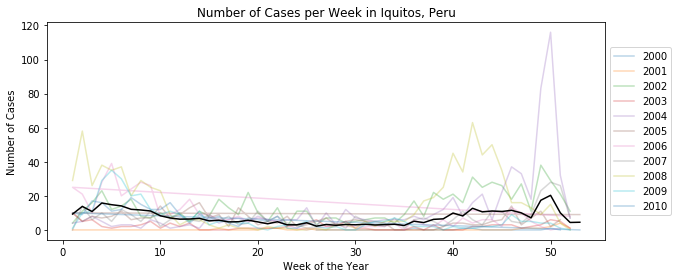

In [17]:
# plot cases for each week each year in San Juan
for i in set(dengue_labels_train_iq['year']):
    df = dengue_labels_train_iq[dengue_labels_train_iq['year'] == i]
    df.set_index('weekofyear', drop = True, inplace = True)
    plt.plot(df['total_cases'], alpha = .3)

dengue_labels_train_iq.groupby('weekofyear')['total_cases'].mean().plot(c = 'k', figsize = (10,4))
plt.legend(set(dengue_labels_train_iq['year']), loc='center left', bbox_to_anchor=(1, .5))

plt.title('Number of Cases per Week in Iquitos, Peru')
plt.xlabel('Week of the Year')
plt.ylabel('Number of Cases')

*** Comments: *** The last 20 weeks and the 10 weeks of the year have a greater incidence of dengue cases. In the south hemisphere at this time of the year we have the winter.

### Check for skewness - Logarithmic transfomation (IQ)

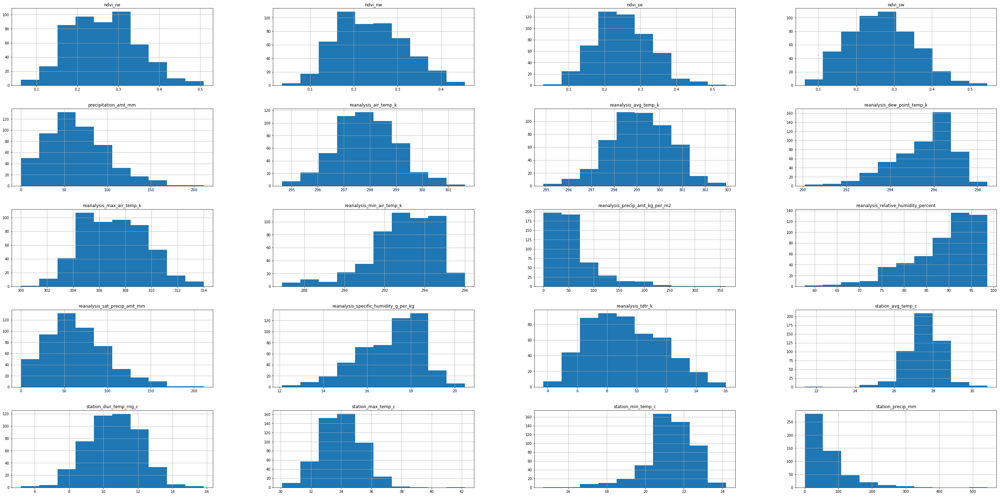

In [18]:
# Check for distribution
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = [50, 25]
dengue_features_train_iq[columns_to_preprocess_iq].hist()
plt.show()

*** Comments: *** The two features are right-skewed:
- reanalysis_precip_amt_kg_per_m2
- station_precip_mm

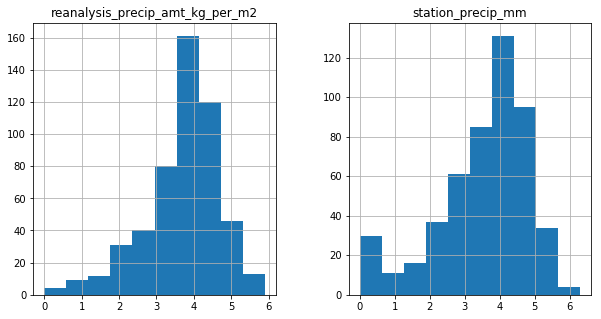

In [19]:
# Let's apply the logarithmic transformation on the following features:
right_skewed_columns_iq = ['reanalysis_precip_amt_kg_per_m2','station_precip_mm']

# Log-transform the skewed features
dengue_log_features_train_iq = pd.DataFrame(data = dengue_features_train_iq)
dengue_log_features_train_iq[right_skewed_columns_iq] = dengue_log_features_train_iq[right_skewed_columns_iq].apply(lambda x: np.log(x + 1))

dengue_log_features_test_iq = pd.DataFrame(data = dengue_features_test_iq)
dengue_log_features_test_iq[right_skewed_columns_iq] = dengue_log_features_test_iq[right_skewed_columns_iq].apply(lambda x: np.log(x + 1))


# Visualize the new log distributions
plt.rcParams['figure.figsize'] = [10, 5]
dengue_log_features_train_iq[right_skewed_columns_iq].hist()
plt.show()

### Feature scaling (IQ)

In [20]:
# Let's check the missing values in the dataset
pd.isnull(dengue_log_features_train_iq).any()

year                                     False
weekofyear                               False
week_start_date                          False
ndvi_ne                                   True
ndvi_nw                                   True
ndvi_se                                   True
ndvi_sw                                   True
precipitation_amt_mm                      True
reanalysis_air_temp_k                     True
reanalysis_avg_temp_k                     True
reanalysis_dew_point_temp_k               True
reanalysis_max_air_temp_k                 True
reanalysis_min_air_temp_k                 True
reanalysis_precip_amt_kg_per_m2           True
reanalysis_relative_humidity_percent      True
reanalysis_sat_precip_amt_mm              True
reanalysis_specific_humidity_g_per_kg     True
reanalysis_tdtr_k                         True
station_avg_temp_c                        True
station_diur_temp_rng_c                   True
station_max_temp_c                        True
station_min_t

In [21]:
# fill the missing values (NaN) with the previous value
dengue_log_features_train_iq.fillna(method='ffill', inplace=True)
dengue_log_features_test_iq.fillna(method='ffill', inplace=True)

# Normalization should be done on both, train and test features datasets, ensuring that the values in both datasets 
# remain of same magnitude. Therefore these datasets will be joined, applied the minmax normalization, and then splitted.
dengue_log_features_train_iq['data_set'] = 'train'
dengue_log_features_test_iq['data_set']  = 'test'

dengue_norm_log_features_iq  = dengue_log_features_train_iq.append(dengue_log_features_test_iq)

# Initialize a scaler, then apply it to the features
scaler = MinMaxScaler() # default=(0, 1)
dengue_norm_log_features_iq[columns_to_preprocess_iq] = scaler.fit_transform(dengue_norm_log_features_iq[columns_to_preprocess_iq])

# sepparate into the original datasets, droppng the temporary columns 'data_set'
dengue_norm_log_features_train_iq = dengue_norm_log_features_iq[dengue_norm_log_features_iq['data_set'] == 'train']
dengue_norm_log_features_train_iq = dengue_norm_log_features_train_iq.reset_index(drop = True)
dengue_norm_log_features_train_iq = dengue_norm_log_features_train_iq.drop(['data_set'], axis=1)

dengue_norm_log_features_test_iq = dengue_norm_log_features_iq[dengue_norm_log_features_iq['data_set'] == 'test']
dengue_norm_log_features_test_iq = dengue_norm_log_features_test_iq.reset_index(drop = True)
dengue_norm_log_features_test_iq = dengue_norm_log_features_test_iq.drop(['data_set'], axis=1)

# Show an example of a record with scaling applied
display(dengue_norm_log_features_train_iq.head(n = 1))

,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
0,2000,26,2000-07-01,0.29366,0.224733,0.611693,0.379834,0.120524,0.29611,0.421677,...,0.642719,0.848334,0.120524,0.543713,0.423434,0.531915,0.525943,0.230159,0.65,0.220064


### Check for outliers in IQ dataset

In [22]:
# Get list of outliers using turkey method
outliersList_iq = []
outliers_iq = []

# For each feature find the data points with extreme high or low values
for feature in columns_to_preprocess_iq:
    
    # TODO: Calculate Q1 (25th percentile of the data) for the given feature
    Q1 = np.percentile(dengue_norm_log_features_train_iq[feature], 25)
    
    # TODO: Calculate Q3 (75th percentile of the data) for the given feature
    Q3 = np.percentile(dengue_norm_log_features_train_iq[feature], 75)
       
    # TODO: Use the interquartile range to calculate an outlier step (1.5 times the interquartile range)
    step = (Q3 - Q1)*2
    
    # Display the outliers
   # print("Data points considered outliers for the feature '{}':".format(feature))
    #display(features_log_minmax_transform_sj[~((features_log_minmax_transform_sj[feature] >= Q1 - step) & (features_log_minmax_transform_sj[feature] <= Q3 + step))])
    
    outliersList_iq.append(dengue_norm_log_features_train_iq[~((dengue_norm_log_features_train_iq[feature] >= Q1 - step) & (dengue_norm_log_features_train_iq[feature] <= Q3 + step))].index)


for i in range(len(outliersList_iq)):
    for aux in outliersList_iq[i + 1:]:
        outliers_iq = np.union1d(outliers_iq, np.intersect1d(outliersList_iq[i], aux))

outliers_iq = outliers_iq.astype(int)
print("Outliers: ", outliers_iq, " Total =",len(outliers_iq))
        
# Remove the outliers, if any were specified
dengue_norm_log_outliers_features_train_iq = dengue_norm_log_features_train_iq.drop(dengue_norm_log_features_train_iq.index[outliers_iq]).reset_index(drop = True)
dengue_outliers_labels_train_iq = dengue_labels_train_iq.drop(dengue_labels_train_iq.index[outliers_iq]).reset_index(drop = True)

Outliers:  [  5  10  51 142 158 306 359 368 399]  Total = 9


### Work on Correlation (IQ)

Through the use of Scatter Matrices and correlation heatmaps we can check the correlation between features and check the correlation between features and labels. The objective is to discard irrelevant (or even not less relevant) features.


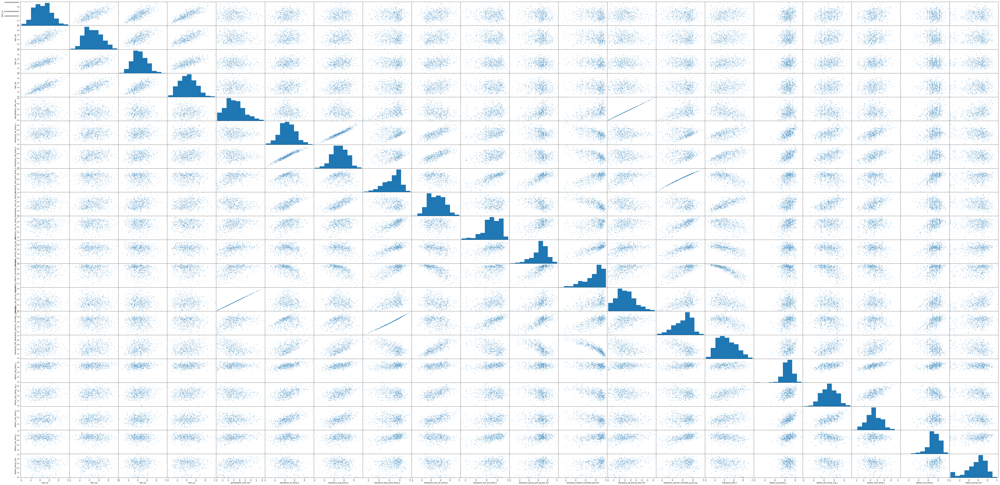

In [23]:
# Scatterplot Matrix - Feature Distributions
plt.rcParams['figure.figsize'] = [100, 50]
scatter_matrix(dengue_norm_log_outliers_features_train_iq[columns_to_preprocess_iq])
plt.show()

Text(0.5,1,'Iquitos Variable Correlations')

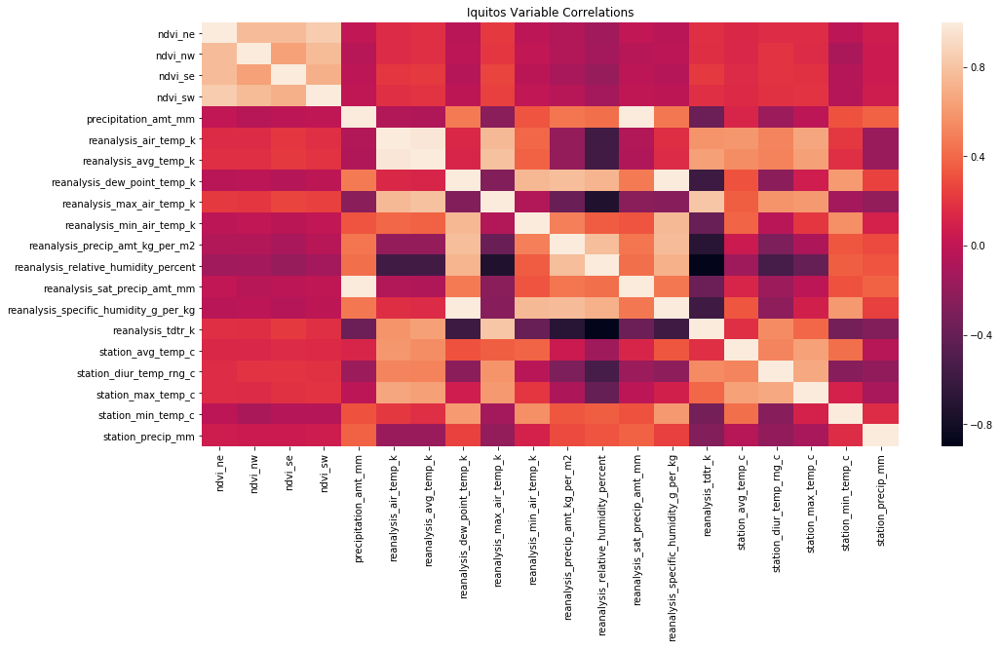

In [24]:
# plot san juan correlation matrix
plt.rcParams['figure.figsize'] = [16, 8]
iq_correlations = dengue_norm_log_outliers_features_train_iq[columns_to_preprocess_iq].corr()
iq_corr_heat = sns.heatmap(iq_correlations)
plt.title('Iquitos Variable Correlations')

*** Comments: *** When checking the above plots, it is clear that a few features shows signs of correlation, which was already expected since some of them are actually measures of the same phenomena but from different sources/readers, e.g. precipitation.

This correlation will allow to positively work on data dimensionality reduction.

In [25]:
# PCA
pca_iq = PCA(n_components=6)
pca_iq.fit(dengue_norm_log_outliers_features_train_iq[columns_to_preprocess_iq])

pca_train_iq = pca_iq.transform(dengue_norm_log_outliers_features_train_iq[columns_to_preprocess_iq])
pca_test_iq = pca_iq.transform(dengue_norm_log_features_test_iq[columns_to_preprocess_iq])

# Create DataFrames for the reduced datasets
pca_train_iq = pd.DataFrame(pca_train_iq, columns=['D1', 'D2', 'D3', 'D4', 'D5', 'D6'])
pca_test_iq = pd.DataFrame(pca_test_iq, columns=['D1', 'D2', 'D3', 'D4', 'D5', 'D6'])

print(pca_iq.explained_variance_ratio_ )
print(pca_iq.explained_variance_ )

[0.35296339 0.21167947 0.15270637 0.08394775 0.0532393  0.03187161]
[0.18691863 0.11209898 0.08086863 0.04445616 0.02819391 0.01687823]


In [26]:
# create dataframe with time features
dengue_norm_log_pca_features_test_iq = pd.concat([pca_test_iq, dengue_norm_log_features_test_iq[['year', 'weekofyear', 'week_start_date']]], axis=1, sort=False)
dengue_norm_log_outliers_pca_features_train_iq = pd.concat([pca_train_iq, dengue_norm_log_outliers_features_train_iq[['year', 'weekofyear', 'week_start_date']]], axis=1, sort=False)

### Save preprocessed IQ daset

In [ ]:
# Save Iquitos Data into a csv
dengue_norm_log_pca_features_test_iq.to_csv("preprocessed data\dengue_features_test_iq.csv", encoding='utf-8', index=False)
dengue_norm_log_outliers_pca_features_train_iq.to_csv("preprocessed data\dengue_features_train_iq.csv", encoding='utf-8', index=False)
dengue_outliers_labels_train_iq.to_csv("preprocessed data\dengue_labels_train_iq.csv", encoding='utf-8', index=False)